_This document is part of [doper](https://github.com/mwermelinger/doper),
a collection of domain-oriented programming exercises._

# 2 Stereo Sound

This is the second part on how to
generate, manipulate, play and display sound waves with Jupyter notebooks.
I assume you have read the [first part](1-mono.ipynb).

The two exercises in this notebook are based on Parts 1 and 3 of Daniel Zingaro's
[Stereo Sound Processing](https://www.danielzingaro.com/sound_proc2/assignment.html)
assignment.

I removed my solution code but kept the resulting sound and images,
so that you can hear and see what your code should generate.
When editing this notebook, only run one code cell at a time.
If you run all cells you will lose the pre-generated sounds and images.

## 2.1 Introduction

Stereo sound consists of two **channels**: two sequences of samples of the same length.
One channel is played on the left loudspeaker and the other on the right one.

We represent stereo sound simply as a pair of lists of floats from -1 to 1.
Let's generate some stereo noise.

In [1]:
from random import uniform

rate = 44100    # samples per second
duration = 2    # seconds
left = []
right = []
for sample in range(rate * duration):
    left.append(uniform(-1.0, 1.0))
    right.append(uniform(-1.0, 1.0))
noise = [left, right]

The `play` and `show` functions in `sound.py`  can handle stereo sound.

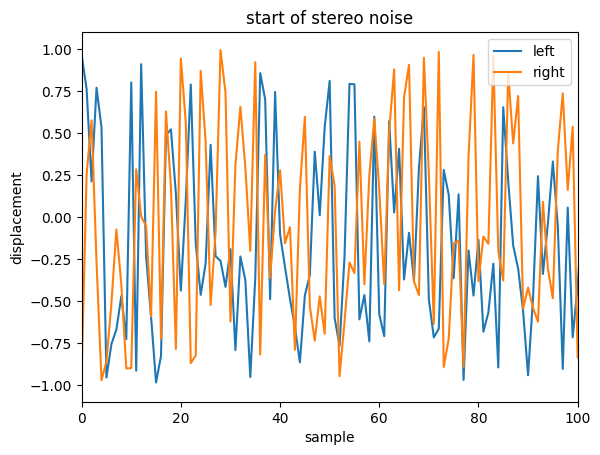

In [2]:
from sound import *

show(noise, 0, 100, 'start of stereo noise')
play(noise, rate)

## 2.2 Panning

For your first exercise, download the
[airplane sound](https://www.danielzingaro.com/sound_proc2/love.wav)
provided by Zingaro and put it in the same folder as this notebook.

The sound is stored in the [WAV format](https://en.wikipedia.org/wiki/WAV),
which can be read by function `load` in `sound.py`.
The function returns the sound and its sampling rate.

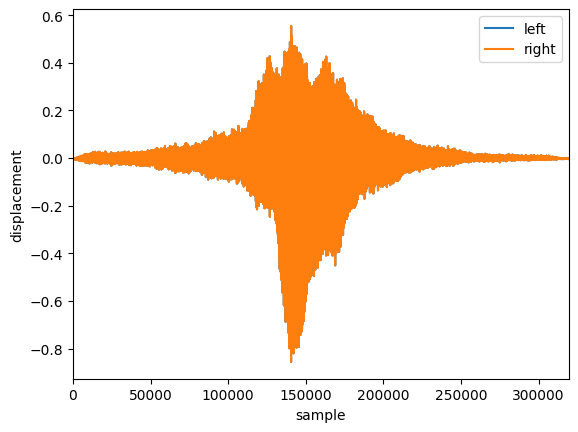

In [3]:
plane_sound, plane_rate = load('airplane.wav')
show(plane_sound)
play(plane_sound, plane_rate)

As the wave image shows, the sound gets louder as the plane approaches us and
then softer as the plane moves away from us.
However, we can only see one of the channels. Let's check if they're the same.

In [4]:
plane_sound[0] == plane_sound[1]

True

Indeed, both channels have exactly the same samples. This gives the impression
the plane is coming directly at us and flying *over* us.

We can make the plane sound as if it's flying in *front* of us, from left to right.
To achieve that, we **pan** the sound from left to right:
we fade out the left channel while at the same time fading in the right channel.
This gives the illusion that the sound source moves from being closer to the left
microphone to being closer to the right microphone.

Complete the following function. You need to
fade out a copy of the left channel over all samples and
fade in a copy of the right channel over all samples.
Function `samples` in `sound.py` returns how many samples a sound has.

In [5]:
def left_to_right(sound: list) -> list:
    """Return a copy of `sound`, panned left to right from start to end.

    You can assume `sound` is stereo.
    """
    # use samples(sound) to determine the number of samples
    pass

If you pan the airplane sound, you should see and hear the following.
I suggest you use earphones to better experience the panning effect.

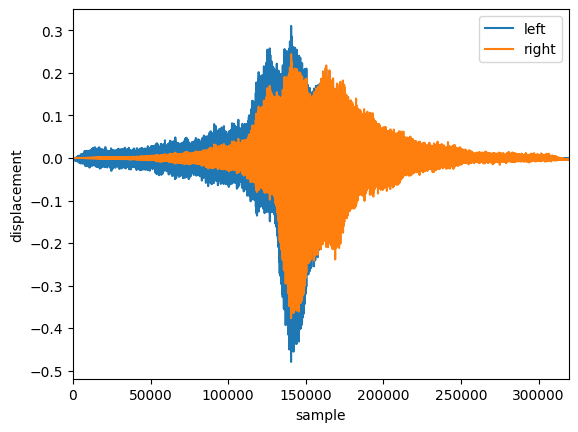

In [6]:
panned = left_to_right(plane_sound)
show(panned)
play(panned, plane_rate)

The sound waves of the left and right channels have the same shape,
but the faded in right channel starts at a lower volume and
gradually 'overshadows' the faded out left channel.

## 2.3 Difference

For this exercise, download the
[love.wav](https://www.danielzingaro.com/sound_proc2/love.wav) and
[cartoon.wav](https://www.danielzingaro.com/sound_proc2/cartoon.wav)
sound clips provided by Zingaro,
and put them in the same folder as this notebook.

Then implement the following algorithm.
It computes the difference of both channels of a stereo sound.
When the left and right samples are the opposite extreme values, the difference is -2 or 2.
So the algorithm halves the difference of the stereo samples
to keep the resulting mono samples within the range (-1, +1).

Remember that function `samples` returns the number of samples in a sound.

In [7]:
def difference(sound: list) -> list:
    """Return a mono copy of stereo `sound`, with the difference of both channels."""
    # create an empty list
    # for each corresponding left and right sample of sound:
        # append to the list the value (left - right) / 2
    # return the list
    pass

If you implemented the difference correctly, you should obtain silence when
computing the difference of the airplane sound channels, because they are equal.

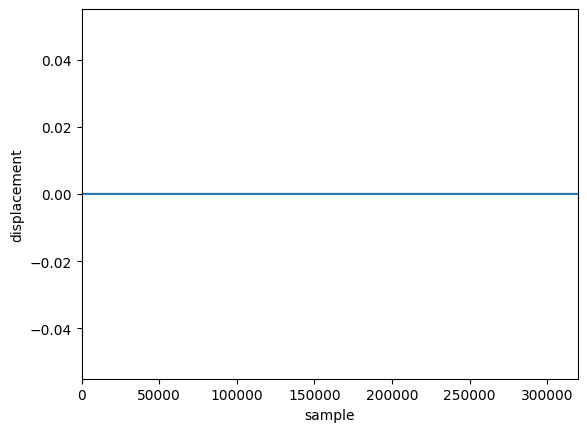

In [8]:
show(difference(plane_sound))

Let's now hear one of the music sound clips and then its mono version.

In [9]:
love_stereo, love_rate = load('love.wav')
play(love_stereo, love_rate)

In [10]:
love_mono = difference(love_stereo)
play(love_mono, love_rate)

The vocal part has become far less prominent.
Often, individual vocalists and instruments are recorded separately,
each with one microphone.
The various mono sounds are then mixed into the final stereo sound.
The difference removes the 'common sound' of both channels,
so any vocal or instrumental sound used on both channels will disappear.

For this clip, the vocals don't disappear. Either the singer was recorded in stereo,
or the mono vocal samples were added unmodified to one channel
and multiplied by some factor (say, 0.9) before adding to the other channel,
to give the impression the singer is not centre stage.

Let's hear the other example.

In [11]:
cartoon_stereo, cartoon_rate = load('cartoon.wav')
play(cartoon_stereo, cartoon_rate)

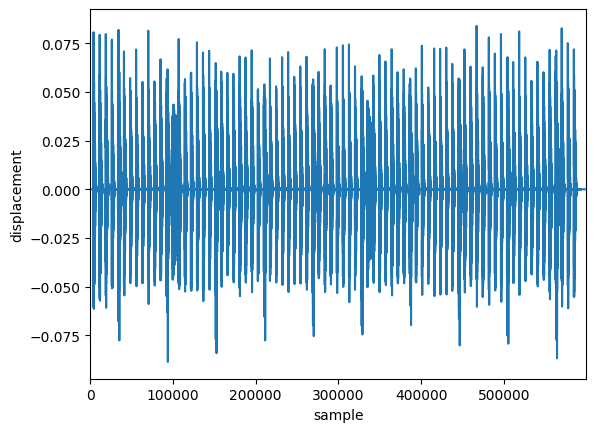

In [12]:
cartoon_mono = difference(cartoon_stereo)
show(cartoon_mono)
play(cartoon_mono, cartoon_rate)

In this clip, the vocal and instrumental parts are the same on both channels.
Only the regular rhythm remains after computing the difference.
As the image shows, the displacement is very small (from about -0.08 to +0.08),
so you may have to turn on the volume to hear the mono clip.